R environment

In [ ]:
library(Seurat)
library(dplyr)
library(cowplot)
library(ggplot2)
library(SeuratWrappers)
library(harmony)
library(SeuratDisk)
library(patchwork)
library(CellID)
library(dittoSeq)
library(HGNChelper)
library(tidyverse) 
library(ggpubr)
library(future)
plan("multiprocess", workers = 8)
options(future.globals.maxSize = 10000 * 1024^10,
        future.rng.onMisuse = 'ignore')

Attaching SeuratObject


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: Rcpp

Registered S3 method overwritten by 'cli':
  method     from         
  print.boxx spatstat.geom

Registered S3 method overwritten by 'SeuratDisk':
  method            from  
  as.sparse.H5Group Seurat


Attaching package: ‘patchwork’


The following object is masked from ‘package:cowplot’:

    align_plots


Loading required package: SingleCellExperiment

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘matrixStats’


The following object is masked from ‘package:dplyr’:

    count



Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, c

R version 4.0.3 (2020-10-10)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: CentOS Linux 7 (Core)

Matrix products: default
BLAS/LAPACK: /hpc/pmc_stunnenberg/cruiz/miniconda3/envs/r_pHGG_project/lib/libopenblasp-r0.3.12.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] parallel  stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] future_1.21.0               ggpubr_0.4.0               
 [3] forcats_0.5.1               stringr_1.4.0              
 [5] purrr_0.3.4                 readr_1.4.0                
 [7] tidyr_1.1.3                 tibble_3.1.1               
 [9] tidyve

In [ ]:
gbm_all <- readRDS('data/core_GBmap_seuratobj_list.rds')

In [ ]:
gbm <- merge(gbm_all[[1]], y = unlist(gbm_all[2:length(gbm_all)]), project = "GBM", merge.data = T)

In [ ]:
# Output a logical vector for every gene on whether the more than zero counts per cell
# Extract counts
counts <- GetAssayData(object = gbm, slot = "counts") 

# Output a logical vector for every gene on whether the more than zero counts per cell
nonzero <- counts > 0

# Sums all TRUE values and returns TRUE if more than 1000 TRUE values per gene
keep_genes <- Matrix::rowSums(nonzero) >= 100

# Only keeping those genes expressed in more than 1000 cells
filtered_counts <- counts[keep_genes, ]

## Restricting to protein-coding genes
data("HgProteinCodingGenes")
filtered_counts <- filtered_counts[rownames(filtered_counts) %in% HgProteinCodingGenes,]

# Read metadata
meta_all <- readRDS('data/core_GBmap_metadata.rds')

# Reassign to filtered Seurat object
filtered_gbm <- CreateSeuratObject(filtered_counts, meta.data = meta_all)

In [ ]:
reference.list <- SplitObject(filtered_gbm, split.by = "author")
reference.list
rm(gbm_all)
rm(gbm)
rm(counts)
rm(filtered_counts)

$Yuan2018
An object of class Seurat 
17262 features across 12202 samples within 1 assay 
Active assay: RNA (17262 features, 0 variable features)

$Neftel2019_10x
An object of class Seurat 
17262 features across 13288 samples within 1 assay 
Active assay: RNA (17262 features, 0 variable features)

$Neftel2019_smart
An object of class Seurat 
17262 features across 5742 samples within 1 assay 
Active assay: RNA (17262 features, 0 variable features)

$Wang2019
An object of class Seurat 
17262 features across 23531 samples within 1 assay 
Active assay: RNA (17262 features, 0 variable features)

$Wang2020
An object of class Seurat 
17262 features across 12437 samples within 1 assay 
Active assay: RNA (17262 features, 0 variable features)

$Zhao2020
An object of class Seurat 
17262 features across 5182 samples within 1 assay 
Active assay: RNA (17262 features, 0 variable features)

$Bhaduri2020
An object of class Seurat 
17262 features across 14934 samples within 1 assay 
Active assay: RNA (1

In [ ]:
for(i in 1:length(reference.list)){
  cat(' #####################################\n',
      '### Processing dataset number ', names(reference.list[i]), '###\n',
      '#####################################\n')
 reference.list[[i]] <- reference.list[[i]] %>% NormalizeData(verbose = FALSE) %>% FindVariableFeatures(verbose = FALSE) %>% 
                        ScaleData(verbose = FALSE) %>% RunMCA(verbose = FALSE) %>% RunPCA(verbose = FALSE)
 reference.list[[i]] <- RunHarmony(reference.list[[i]], group.by.vars = "patient", verbose = FALSE)
 reference.list[[i]] <- reference.list[[i]] %>% RunUMAP(reduction = "harmony", dims = 1:30, verbose = FALSE) %>%
                        FindNeighbors(reduction = "harmony", dims = 1:30, verbose = FALSE) %>% 
                        FindClusters(verbose = FALSE)
}

In [ ]:
signatures <- as.data.frame(readxl::read_excel(paste0('data/table_S2.xlsx')))
signatures <- signatures[-1:-2,] %>% `rownames<-` (NULL)

MES2-like,MES1-like,AC-like,OPC-like,NPC1-like,NPC2-like,G1.S,G2.M,Astrocyte,Neuron,Oligo,OPC,BEC_capillary,Perivascular_fibroblast,Pericyte,SMC,T_cell,TAM-MG,TAM-BDM
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
HILPDA,CHI3L1,CST3,BCAN,DLL3,STMN2,RRM2,CCNB1,SLC1A2,RBFOX1,MBP,DSCAM,FLT1,CEMIP,GRM8,SLIT3,PTPRC,CCL4,HLA-DQA1
ADM,ANXA2,S100B,PLP1,DLL1,CD24,PCNA,CDC20,DPP10,ROBO2,ST18,LHFPL3,ATP10A,BICC1,PDE7B,TAGLN,SKAP1,ADRB2,MS4A6A
DDIT3,ANXA1,SLC1A3,GPR17,SOX4,RND3,KIAA0101,CCNB2,GFAP,CNTNAP2,IL1RAPL1,PCDH15,SLC7A5,FLRT2,LAMA2,RGS6,AOAH,NAV3,TGFBI
NDRG1,CD44,HEPN1,FIBIN,TUBB3,HMP19,HIST1H4C,PLK1,NRG3,SYT1,SLC24A2,TNR,CLDN5,ABCA9,PCBP3,MYH11,PARP8,ADORA3,HLA-DRB5
HERPUD1,VIM,HOPX,LHFPL3,HES6,TUBB3,MLF1IP,CCNA2,ADGRV1,CNTN5,MOBP,CSMD1,ABCB1,ABCA10,DLC1,KCNAB1,THEMIS,SIGLEC8,CD74
DNAJB9,MT2A,MT3,OLIG1,TAGLN3,MIAT,GMNN,CKAP2,GPM6A,CSMD1,CTNNA3,OPCML,ST8SIA6,LAMA2,SLC6A12,MYL9,CD247,SPRY1,DSE
TRIB3,C1S,SPARCL1,PSAT1,NEU4,DCX,RNASEH2A,KNSTRN,ADCY2,GRIK2,PEX5L,KCNIP4,SLC7A1,FBLN1,ATP1A2,ZFHX3,ARHGAP15,TAL1,CD93
ENO2,NAMPT,MLC1,SCRG1,MARCKSL1,NSG1,MELK,RACGAP1,CTNNA2,GALNTL6,KIRREL3,LRRC4C,SLC39A10,LINC01088,RNF152,RCAN2,SYTL3,RHOB,FOSL2
AKAP12,EFEMP1,GFAP,OMG,CD24,ELAVL4,CENPK,CDCA3,FMN2,DLGAP1,NKAIN2,FGF14,ANO2,USP53,SLC38A11,PIP5K1B,IKZF1,BIN1,PLTP


In [ ]:
signatures.list <- list()

for(i in 1:length(colnames(signatures))){
  tmp <- list(na.omit(signatures[[i]]))
#   gene.names <- checkGeneSymbols(tmp, unmapped.as.na=FALSE)
  signatures.list <- append(signatures.list, tmp)
}

names(signatures.list) <- colnames(signatures)


calculating distance


ranking genes

calculating number of success


performing hypergeometric test



calculating distance


ranking genes

calculating number of success


performing hypergeometric test




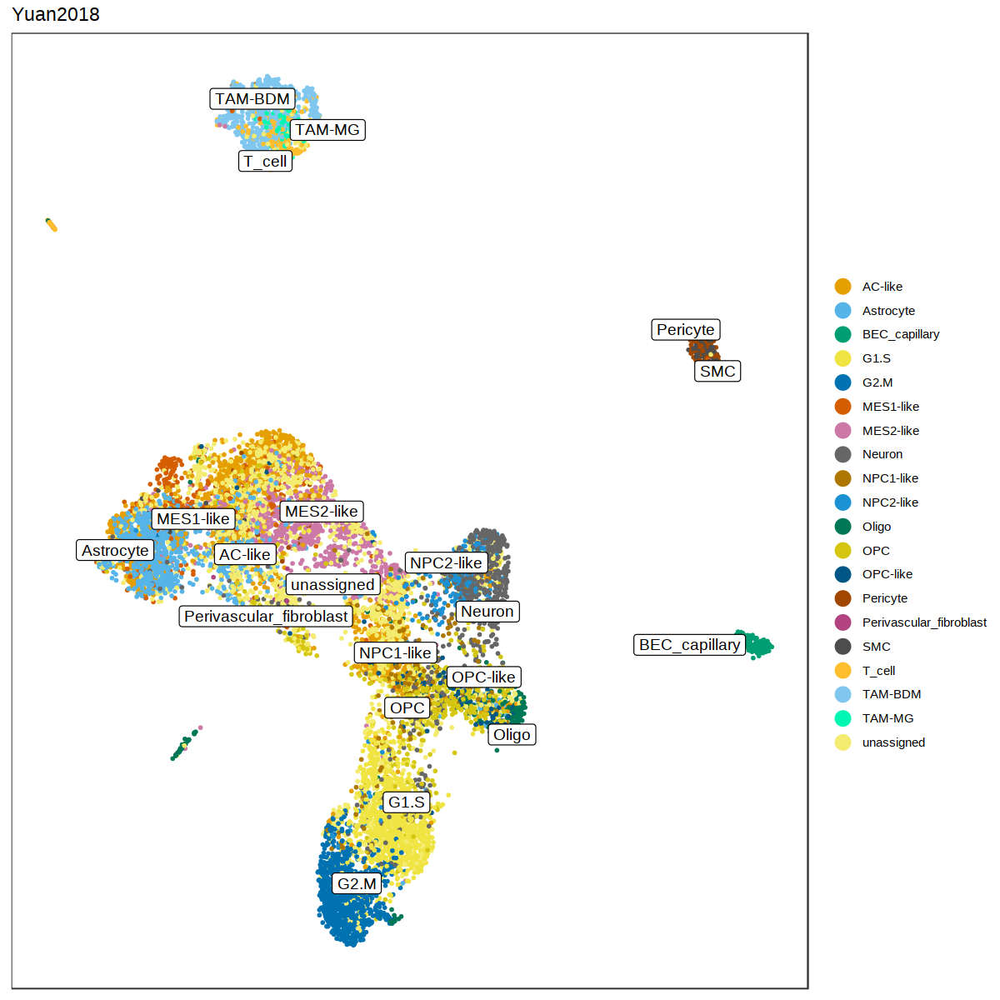

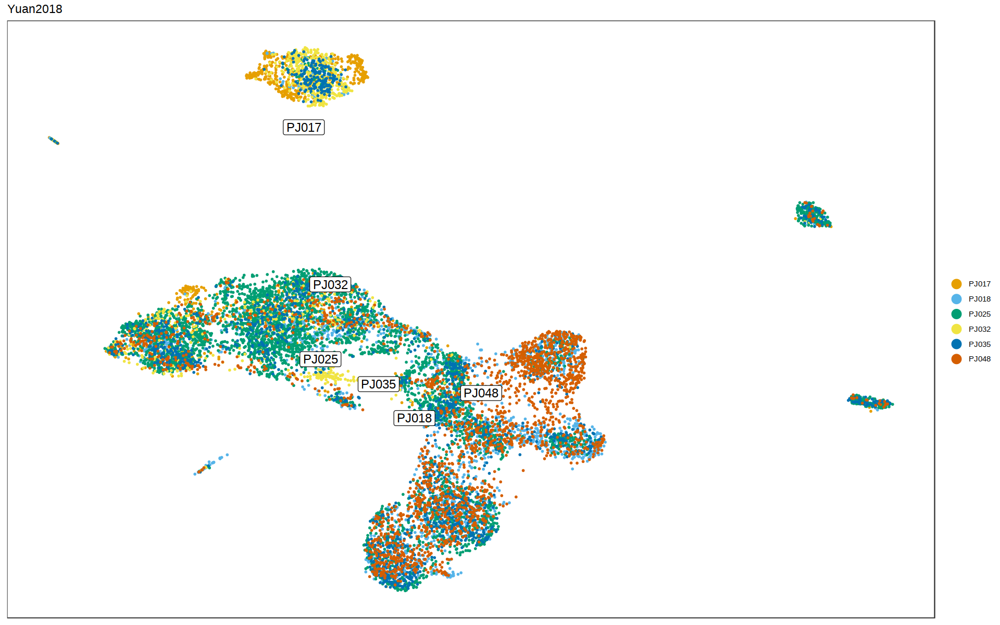


calculating distance


ranking genes

calculating number of success


performing hypergeometric test




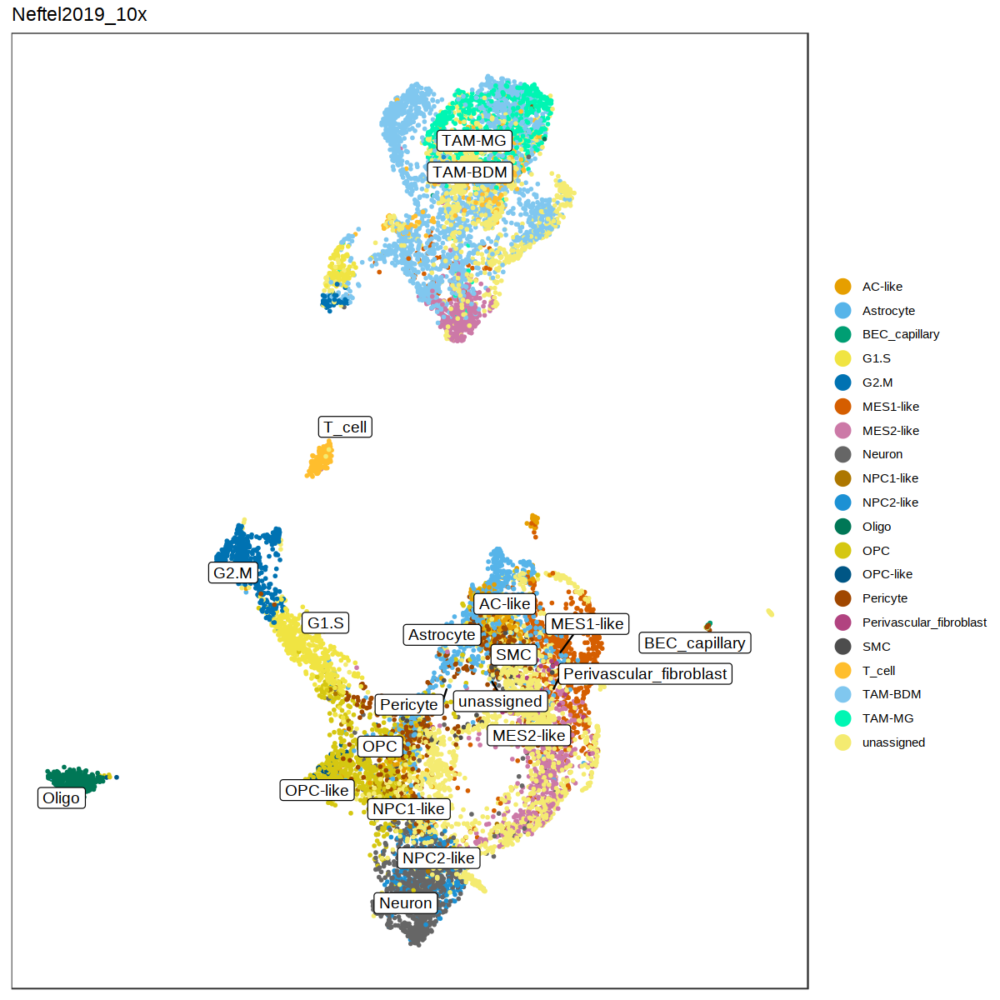

Warning message:
“ggrepel: 3 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


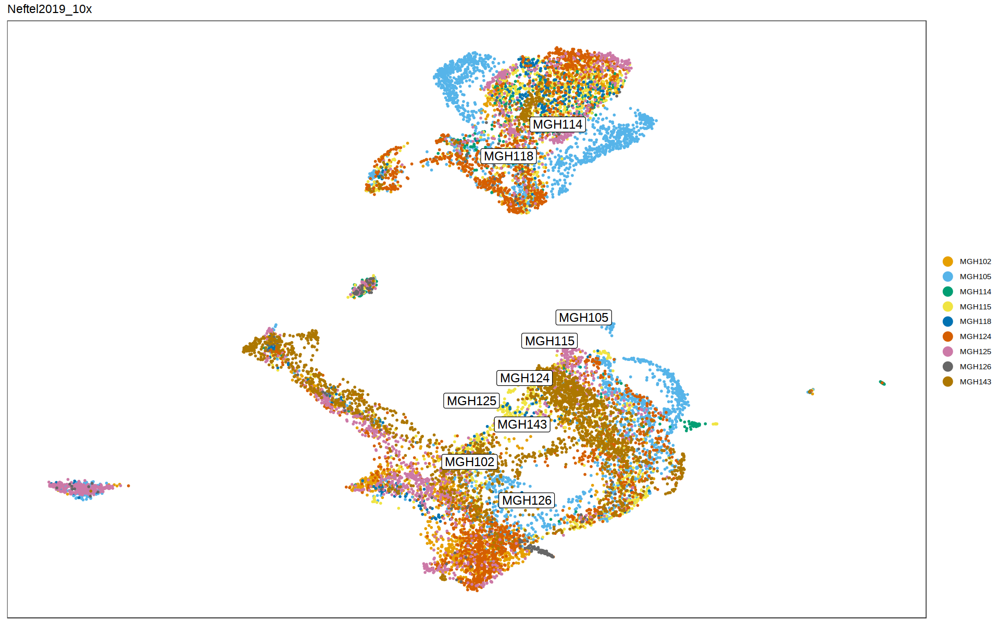

Warning message:
“ggrepel: 17 unlabeled data points (too many overlaps). Consider increasing max.overlaps”

calculating distance


ranking genes

calculating number of success


performing hypergeometric test




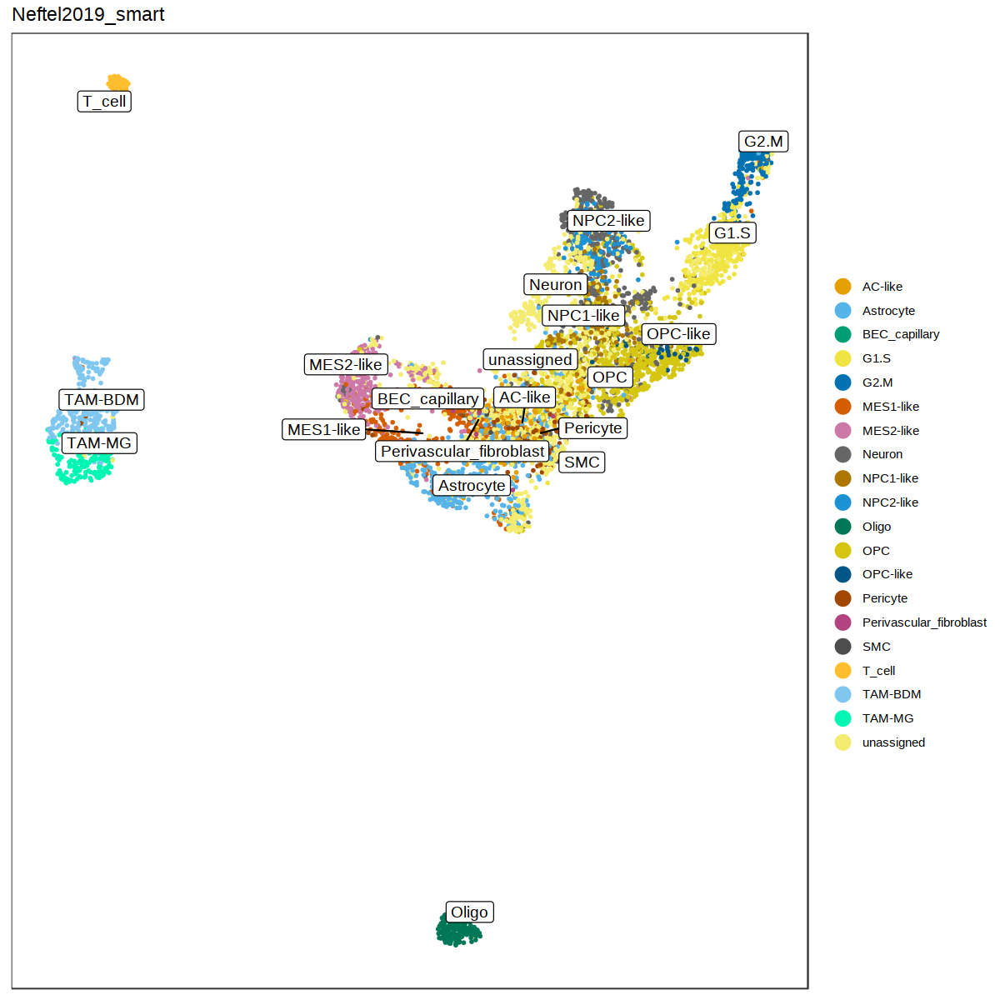

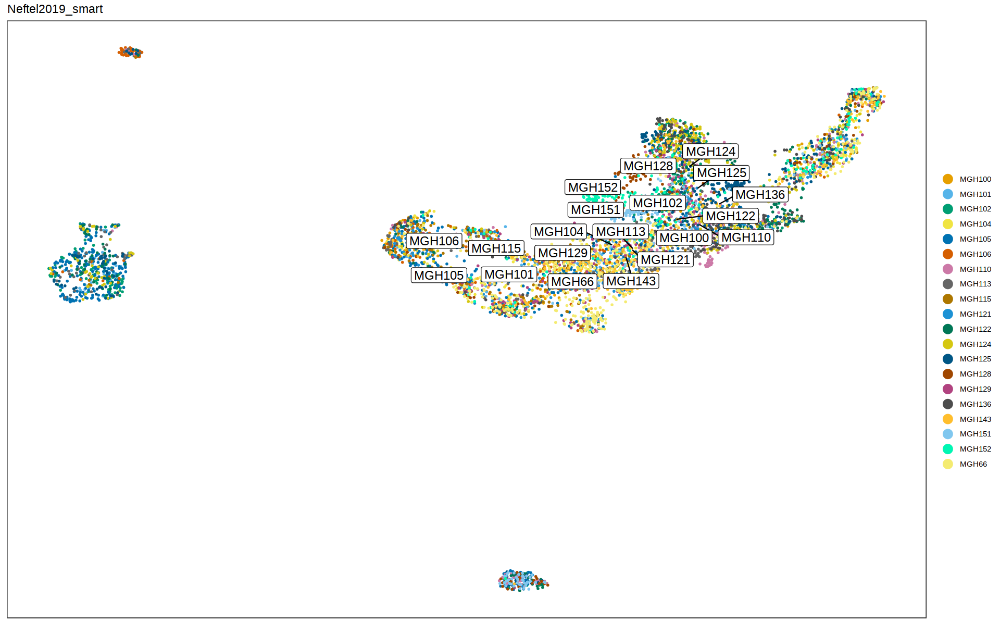


calculating distance


ranking genes

calculating number of success


performing hypergeometric test




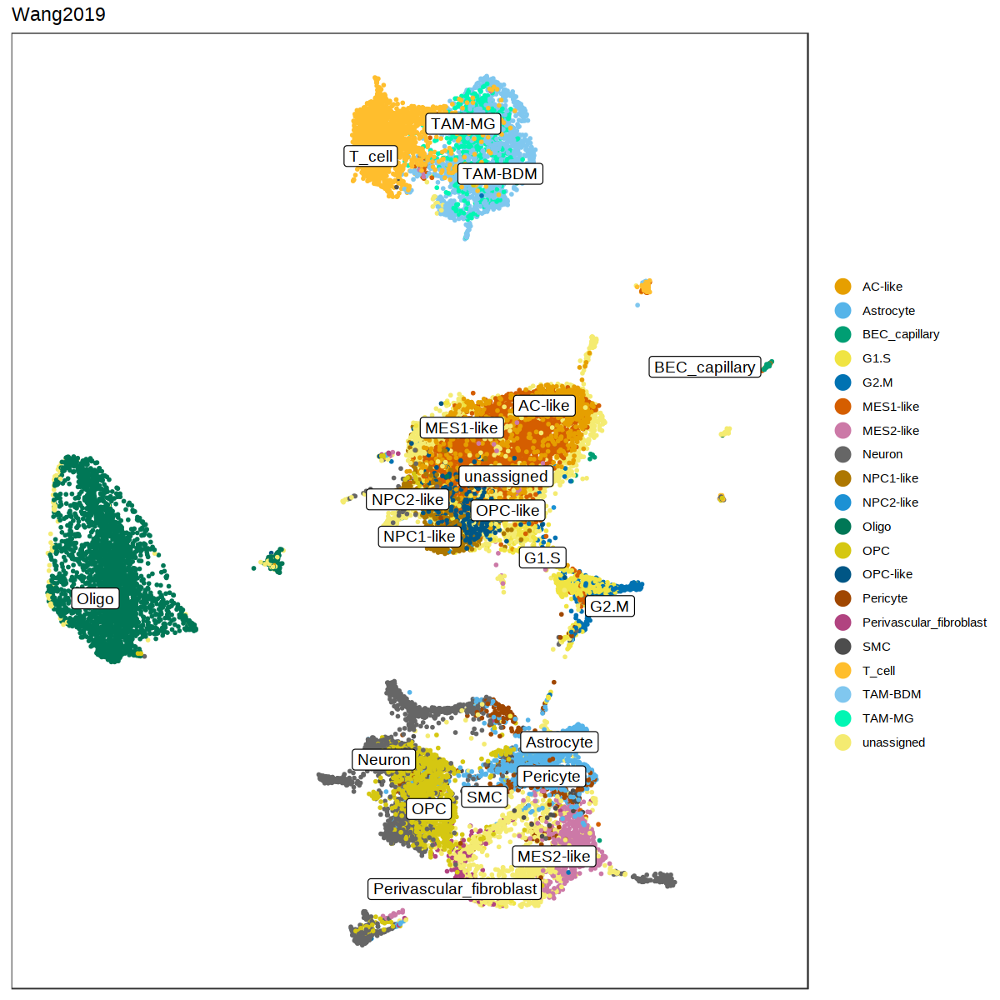

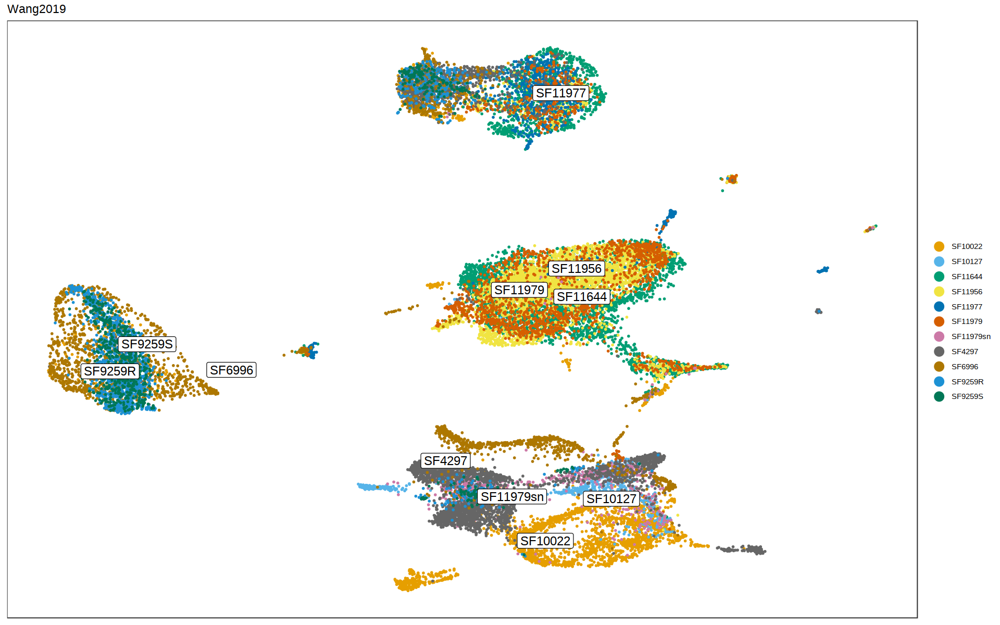


calculating distance


ranking genes

calculating number of success


performing hypergeometric test




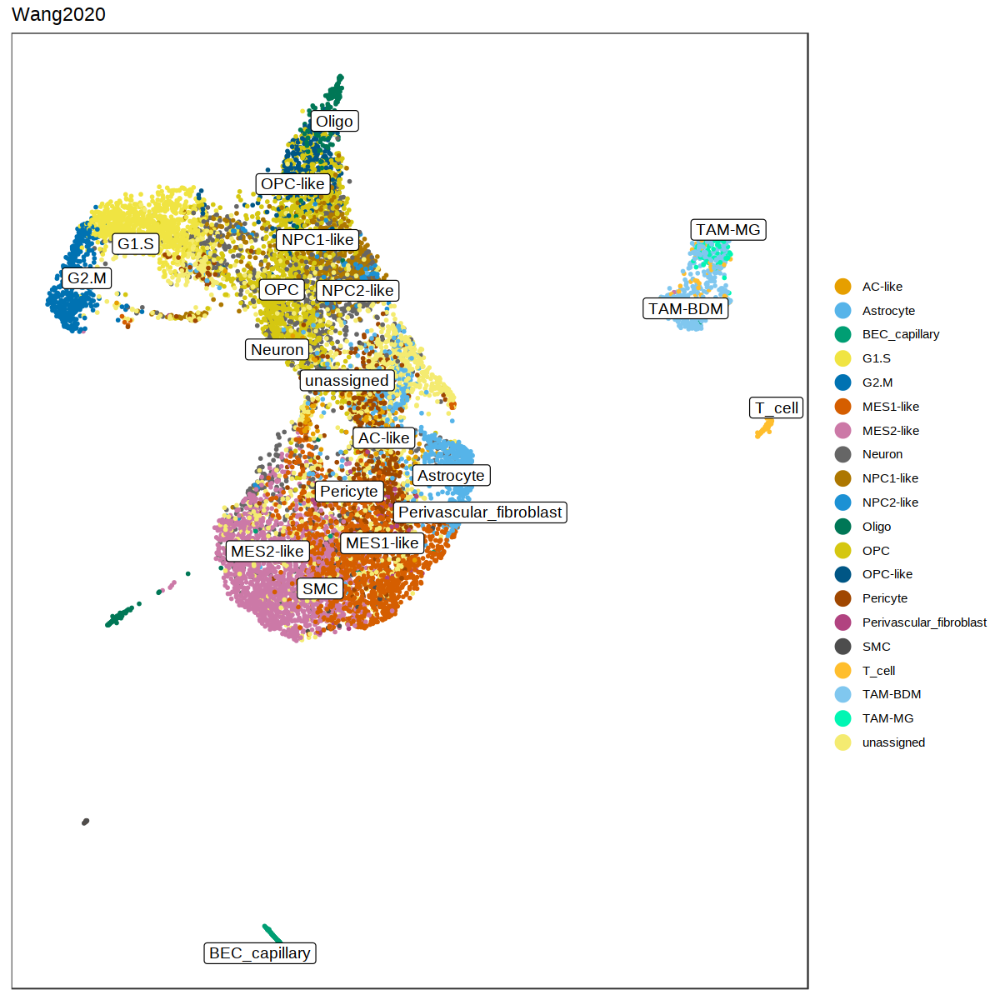

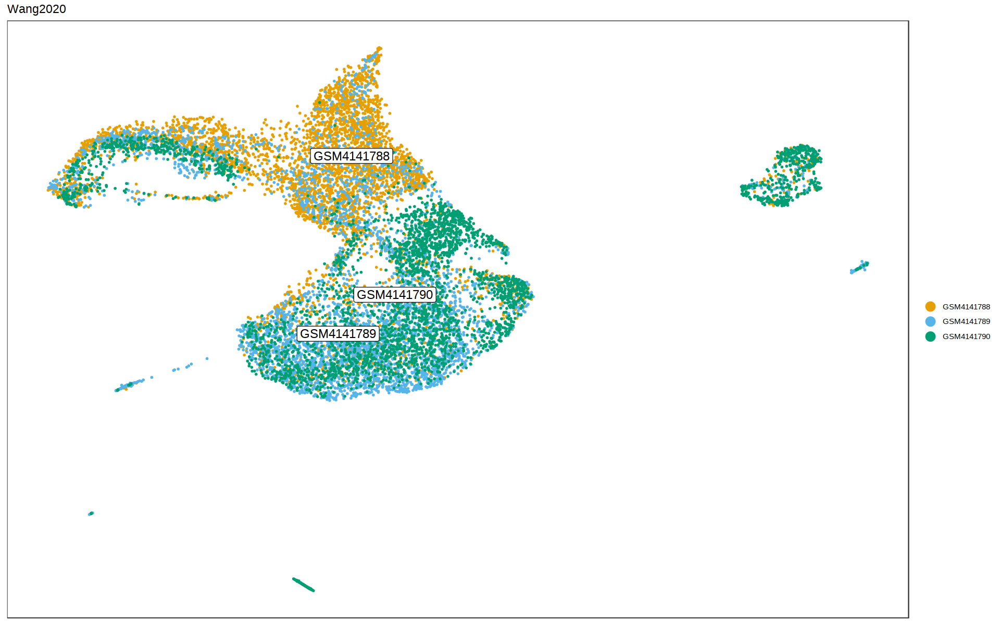


calculating distance


ranking genes

calculating number of success


performing hypergeometric test




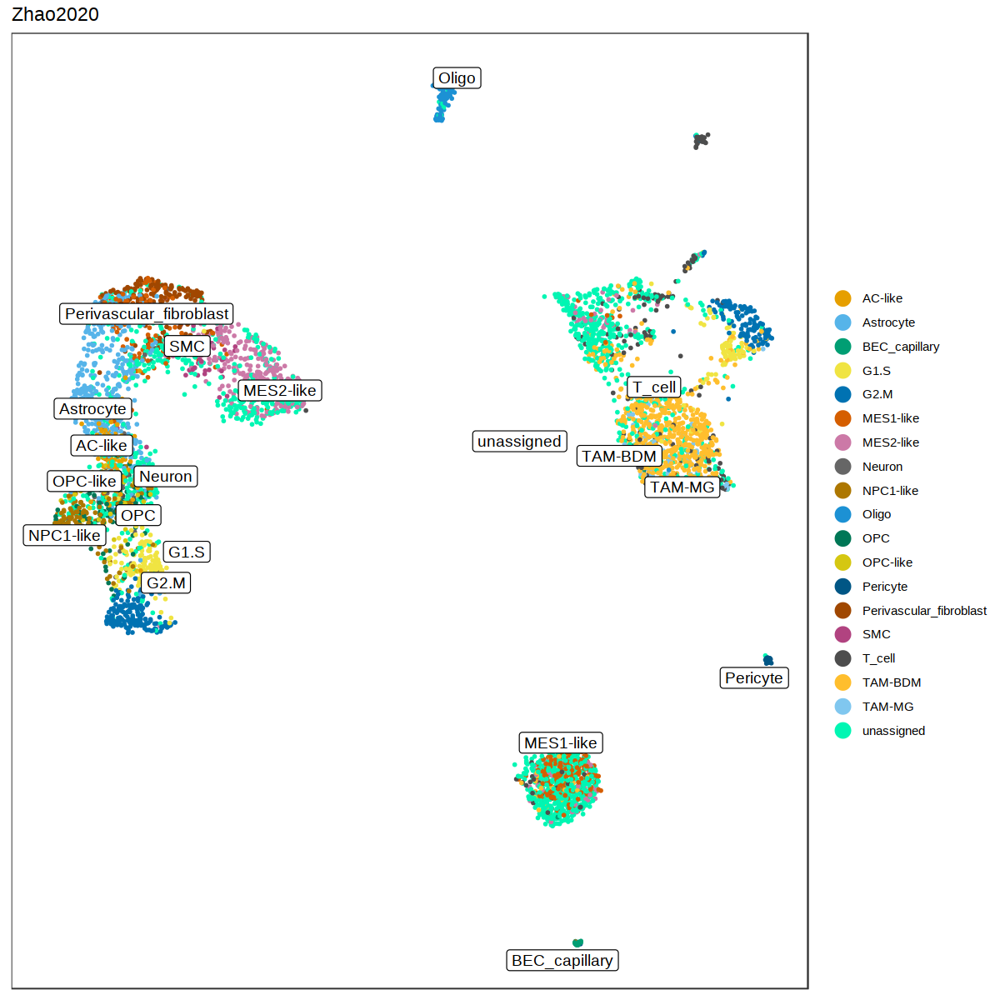

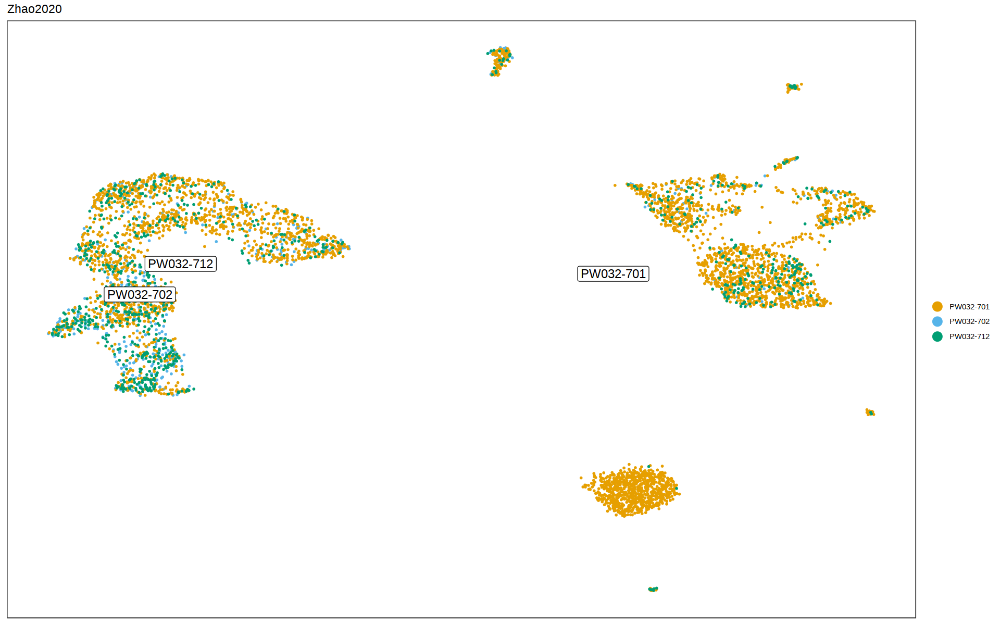


calculating distance


ranking genes

calculating number of success


performing hypergeometric test




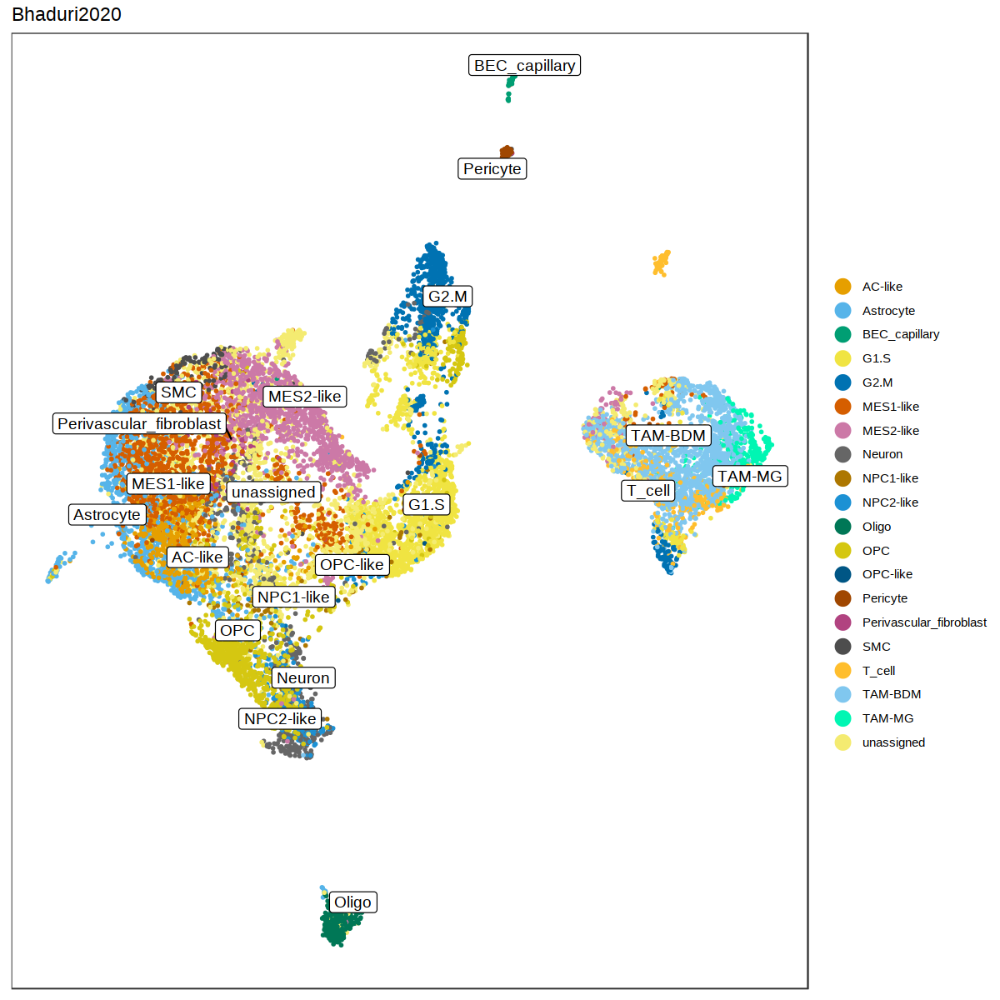

Warning message:
“ggrepel: 2 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


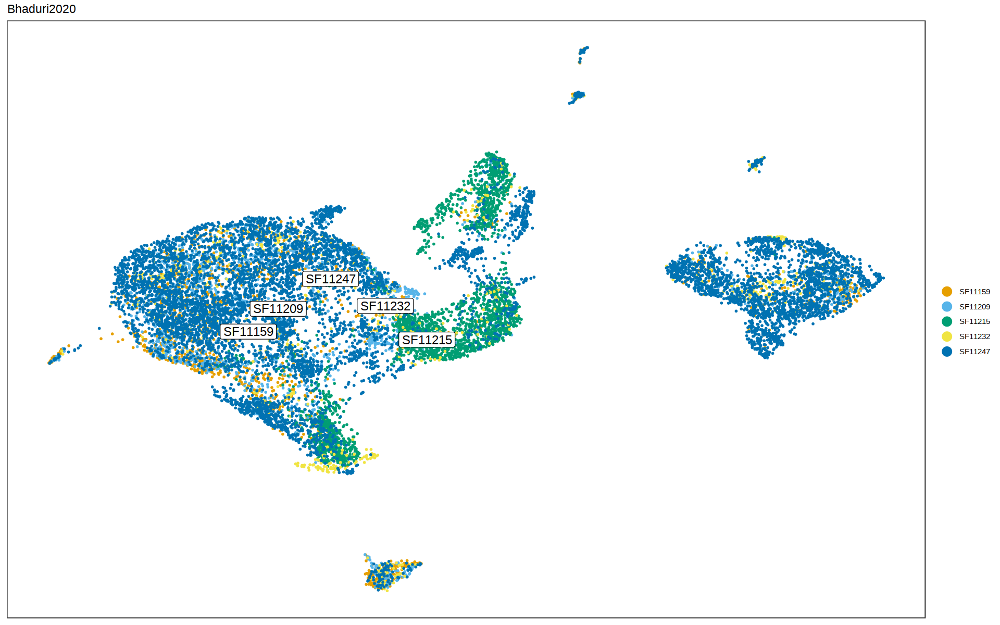


calculating distance


ranking genes

calculating number of success


performing hypergeometric test




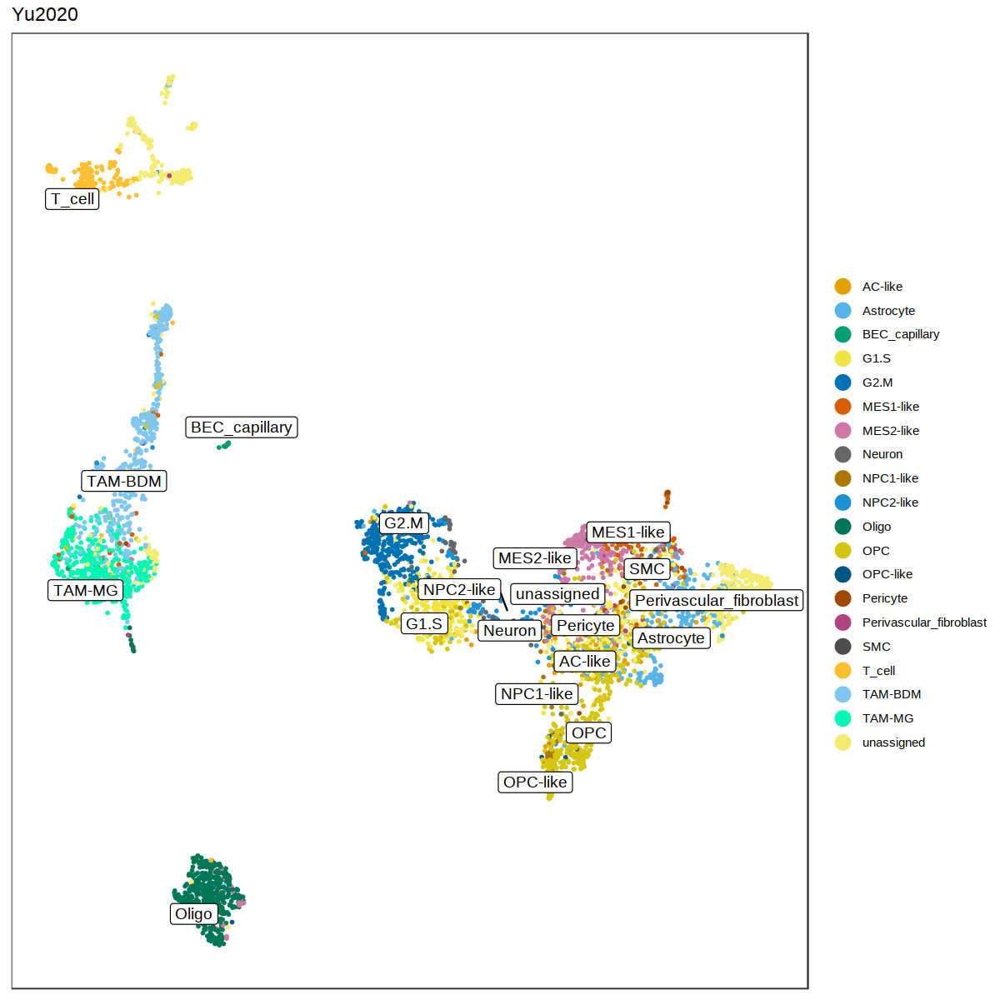

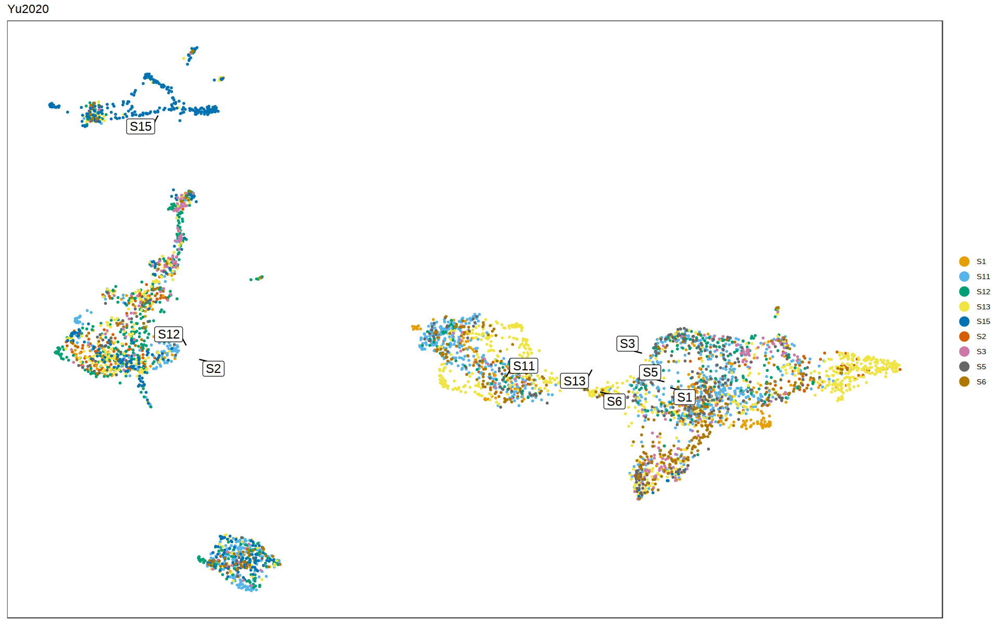


calculating distance


ranking genes

calculating number of success


performing hypergeometric test




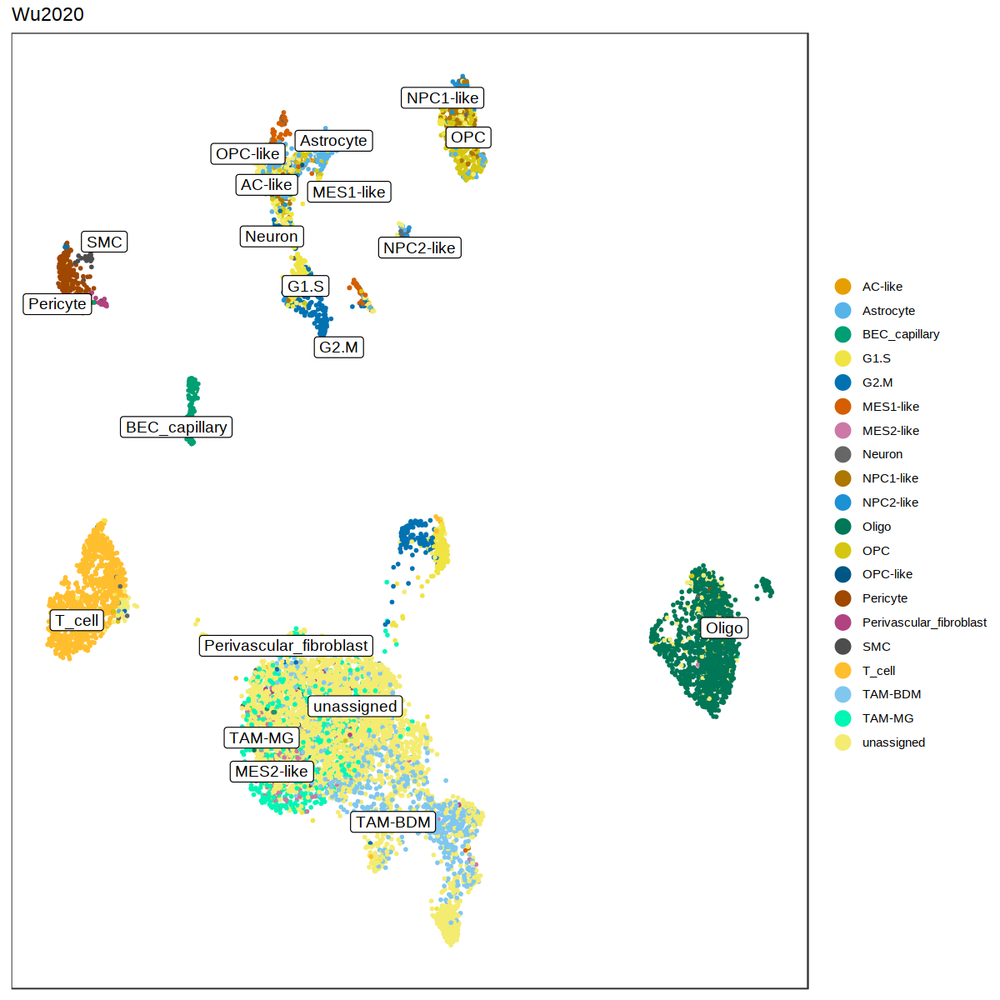

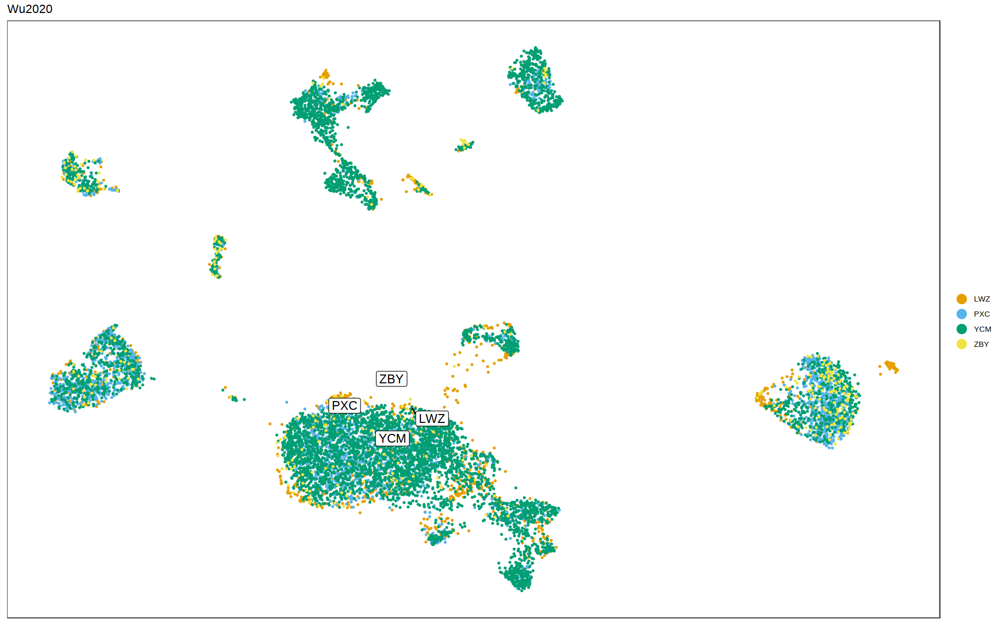


calculating distance


ranking genes

calculating number of success


performing hypergeometric test




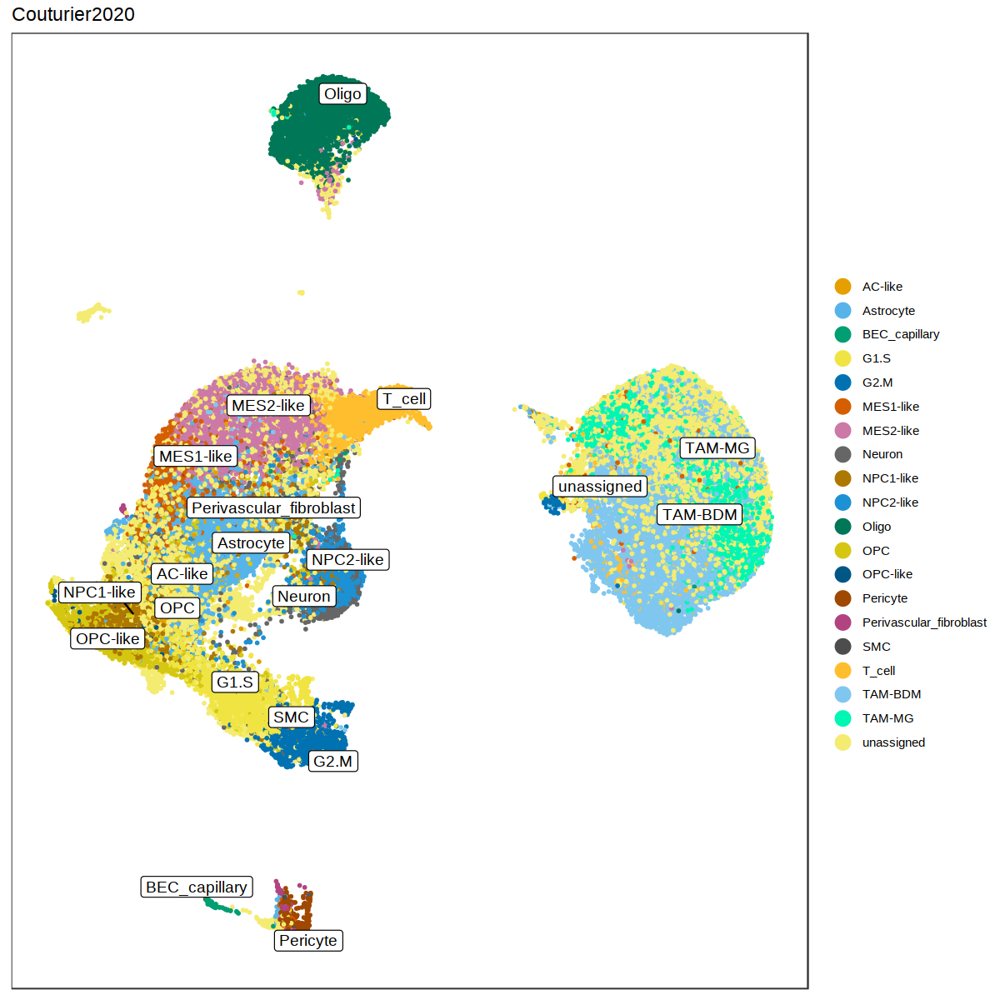

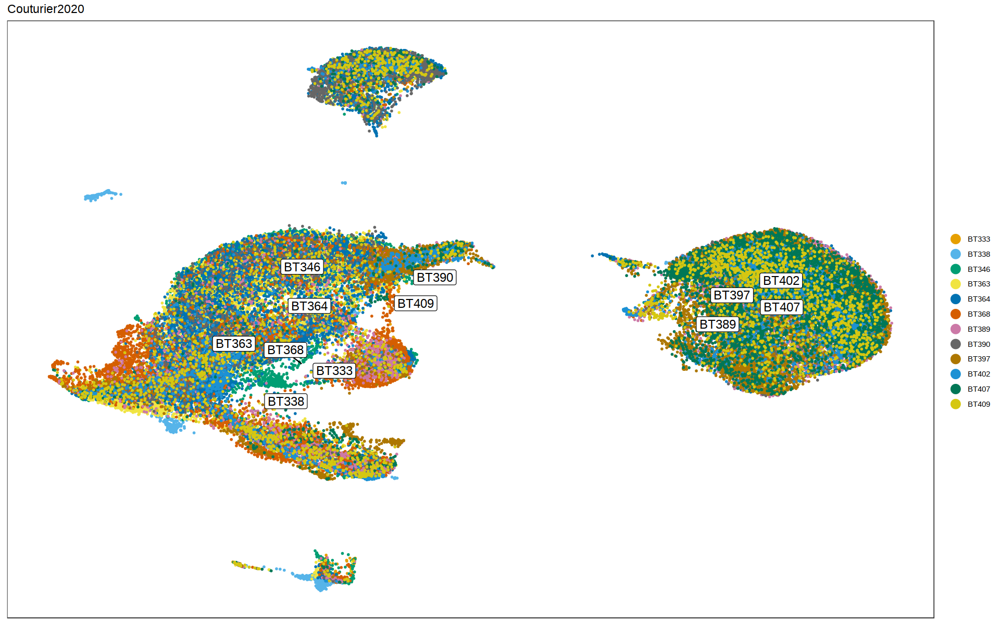


calculating distance


ranking genes

calculating number of success


performing hypergeometric test




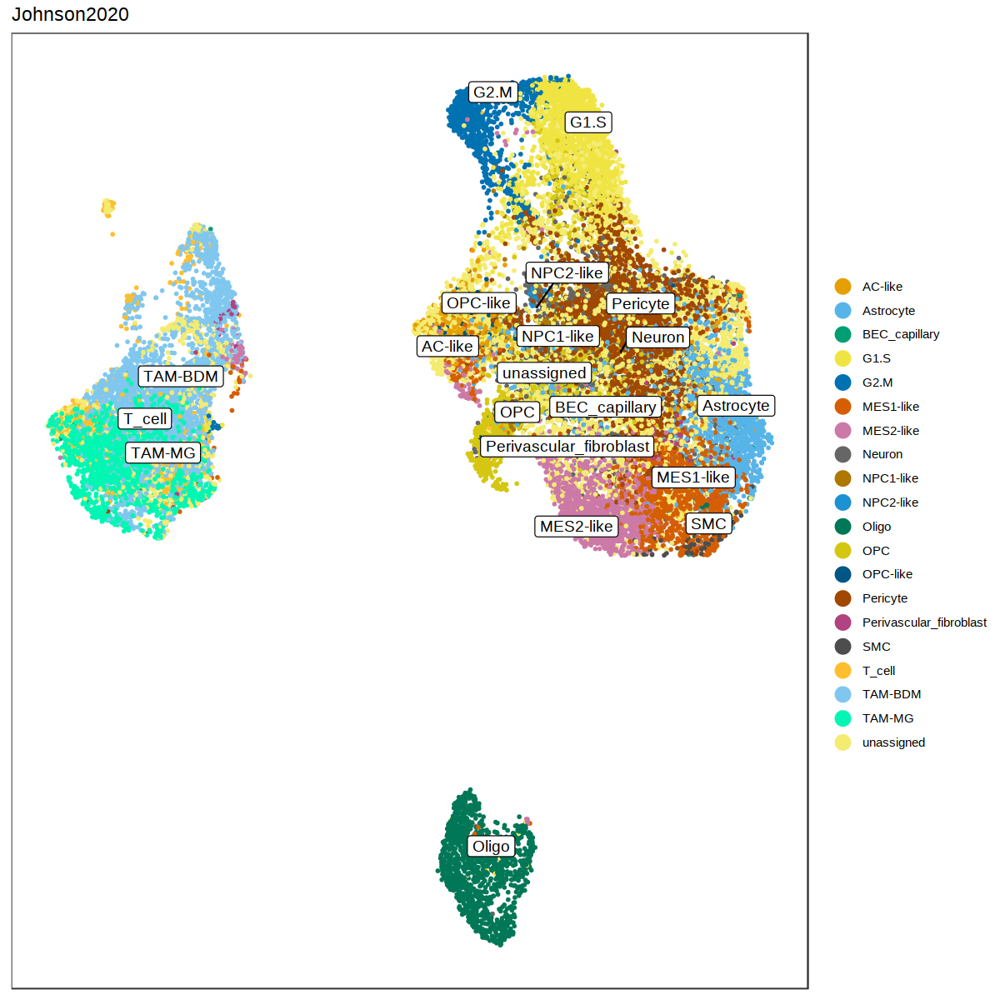

Warning message:
“ggrepel: 1 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


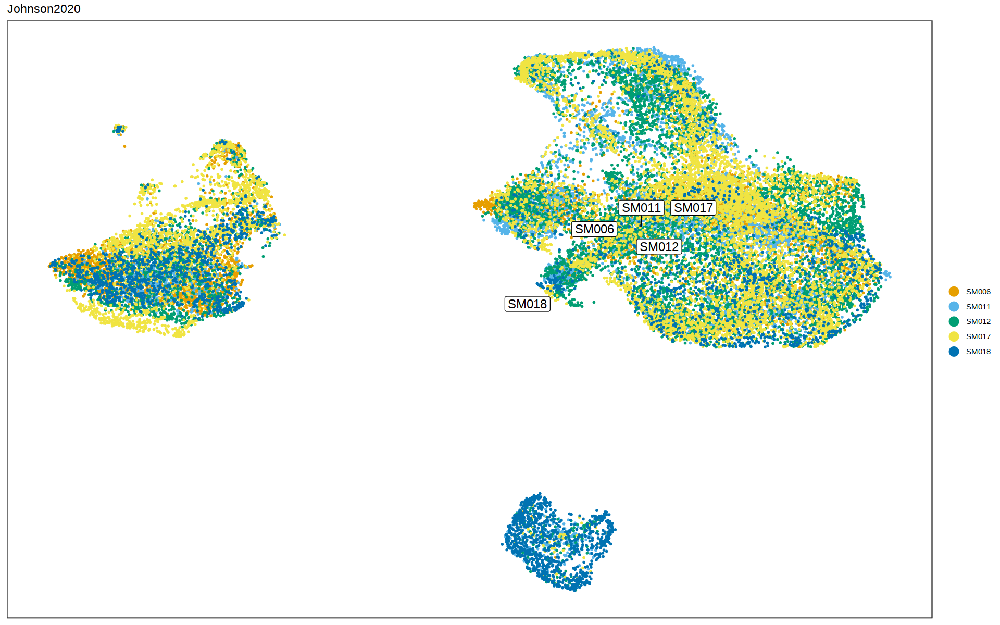

Warning message:
“ggrepel: 8 unlabeled data points (too many overlaps). Consider increasing max.overlaps”

calculating distance


ranking genes

calculating number of success


performing hypergeometric test




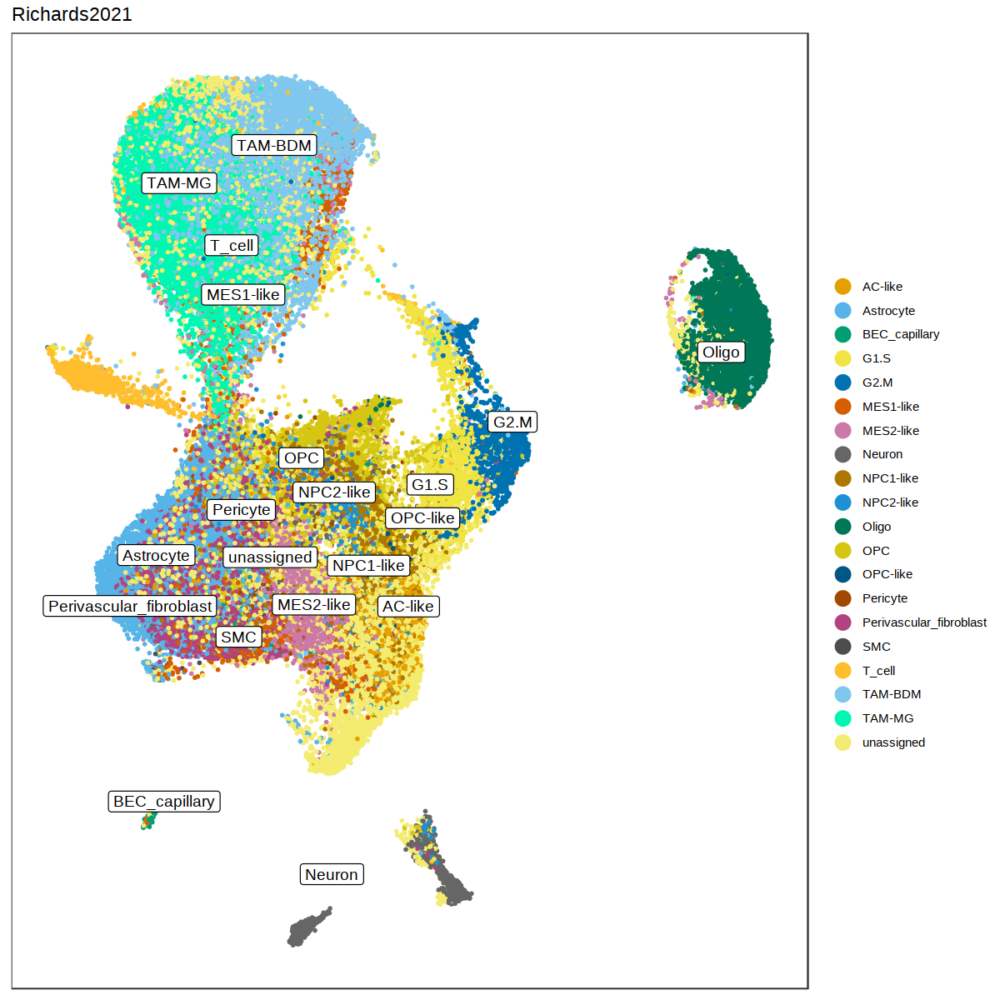

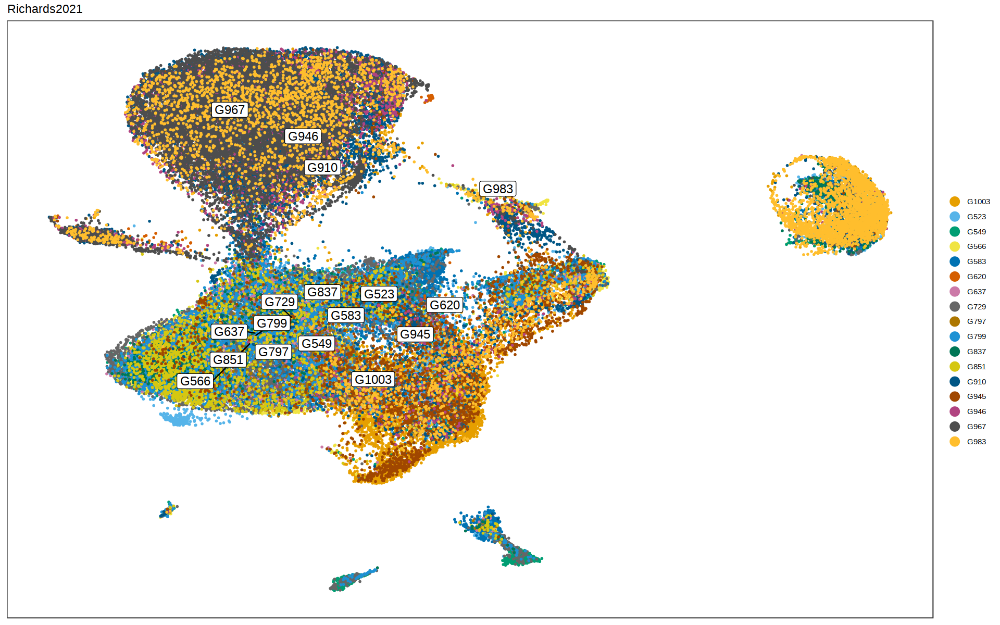


calculating distance


ranking genes

calculating number of success


performing hypergeometric test




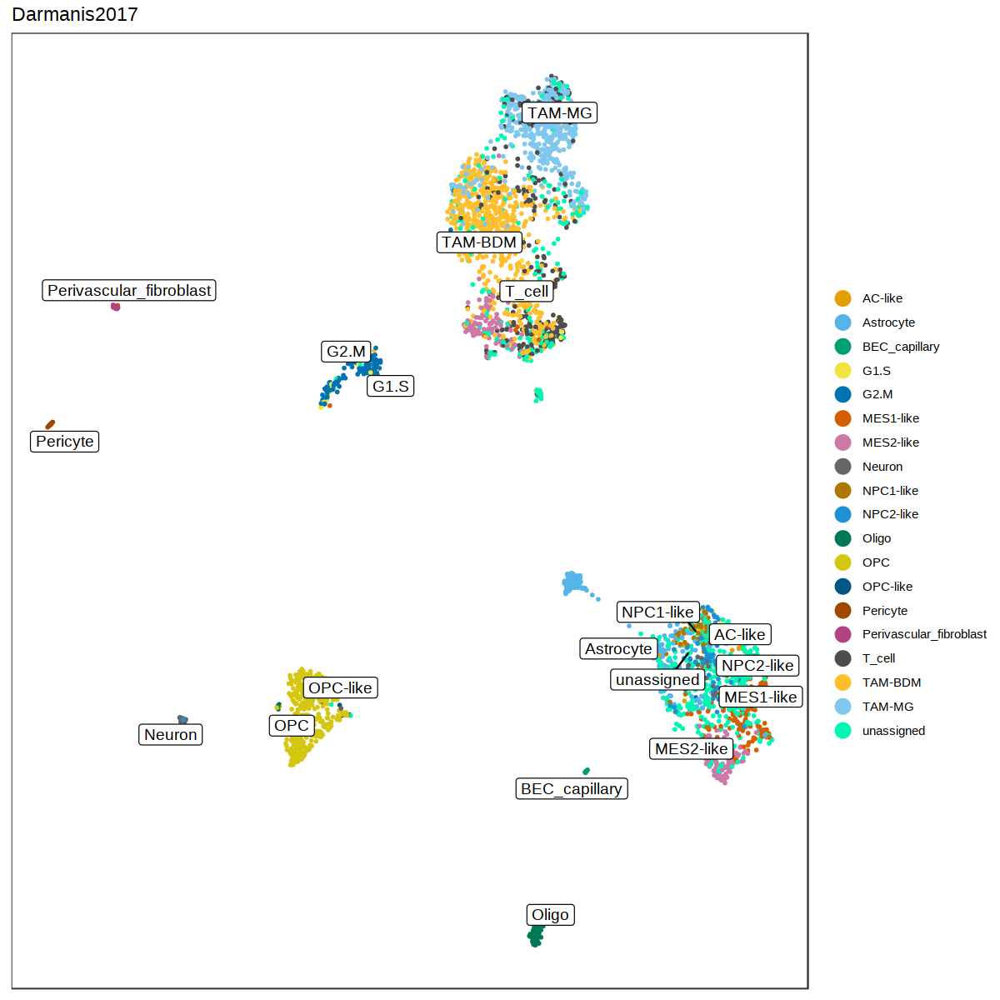

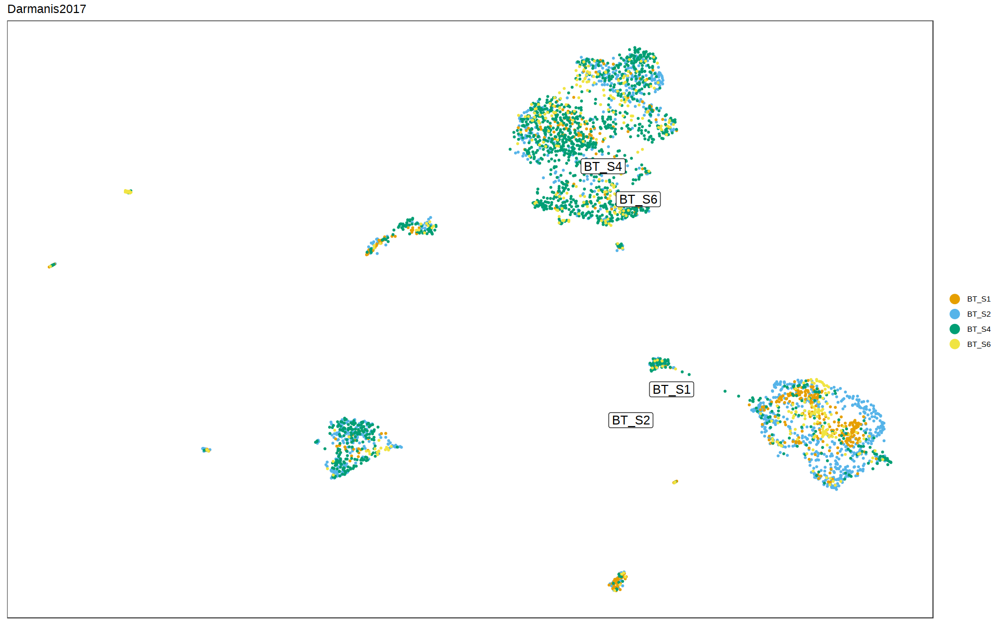

Warning message:
“ggrepel: 5 unlabeled data points (too many overlaps). Consider increasing max.overlaps”

calculating distance


ranking genes

calculating number of success


performing hypergeometric test




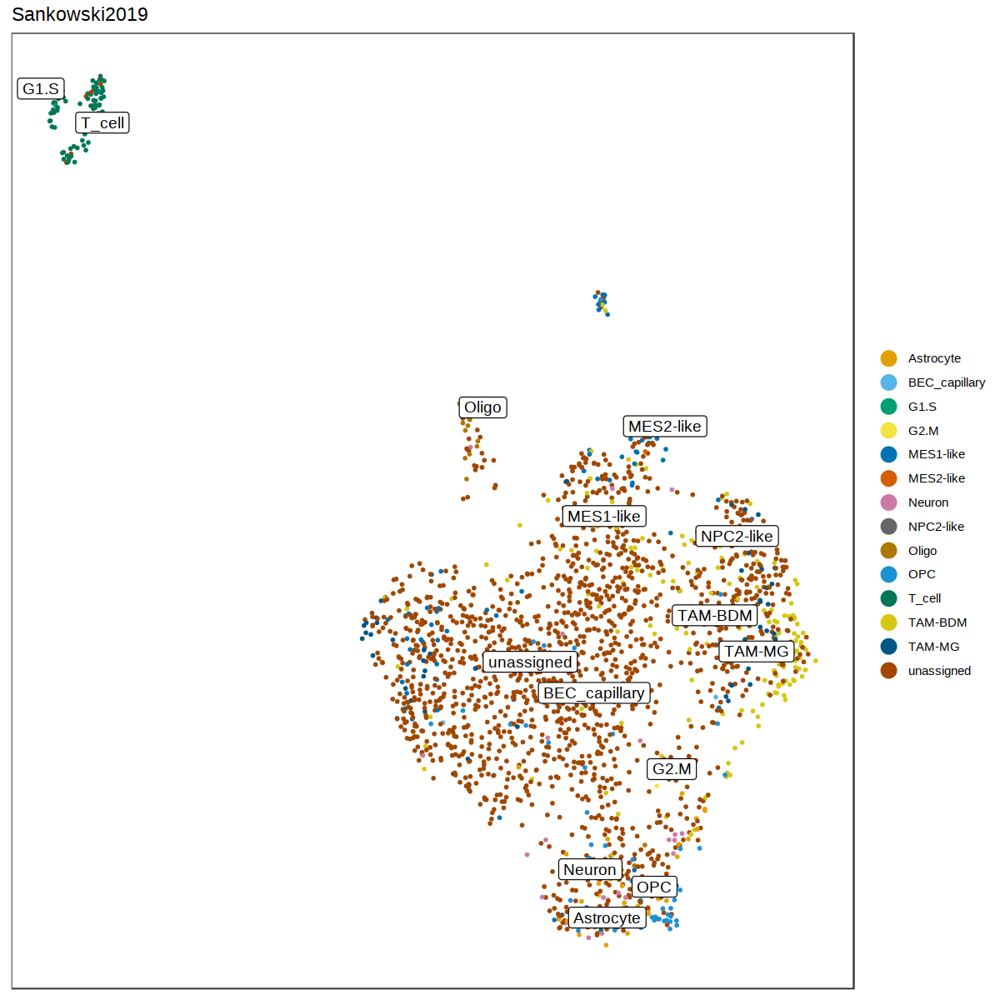

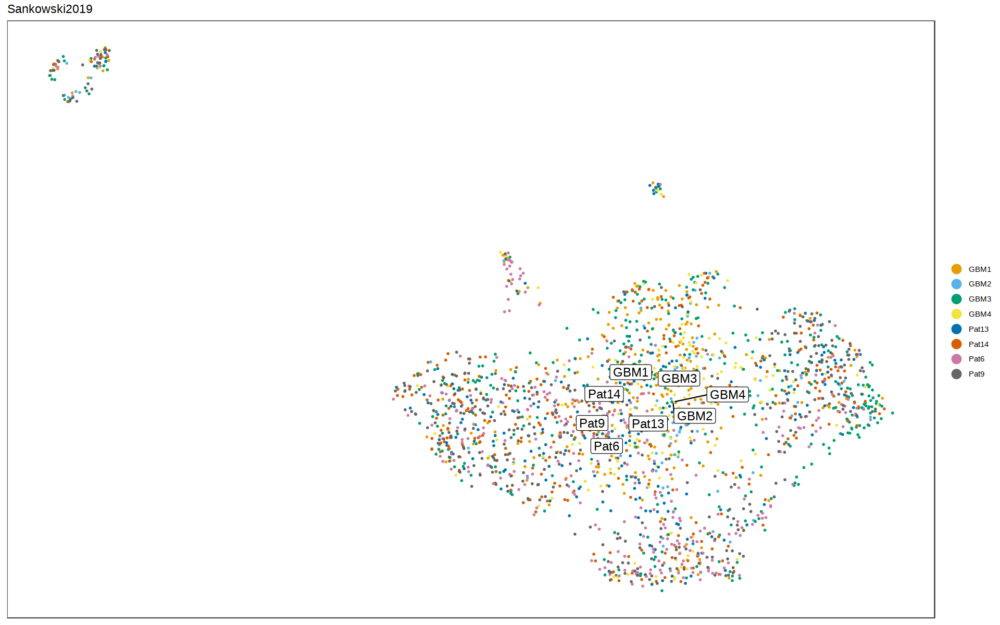


calculating distance


ranking genes

calculating number of success


performing hypergeometric test




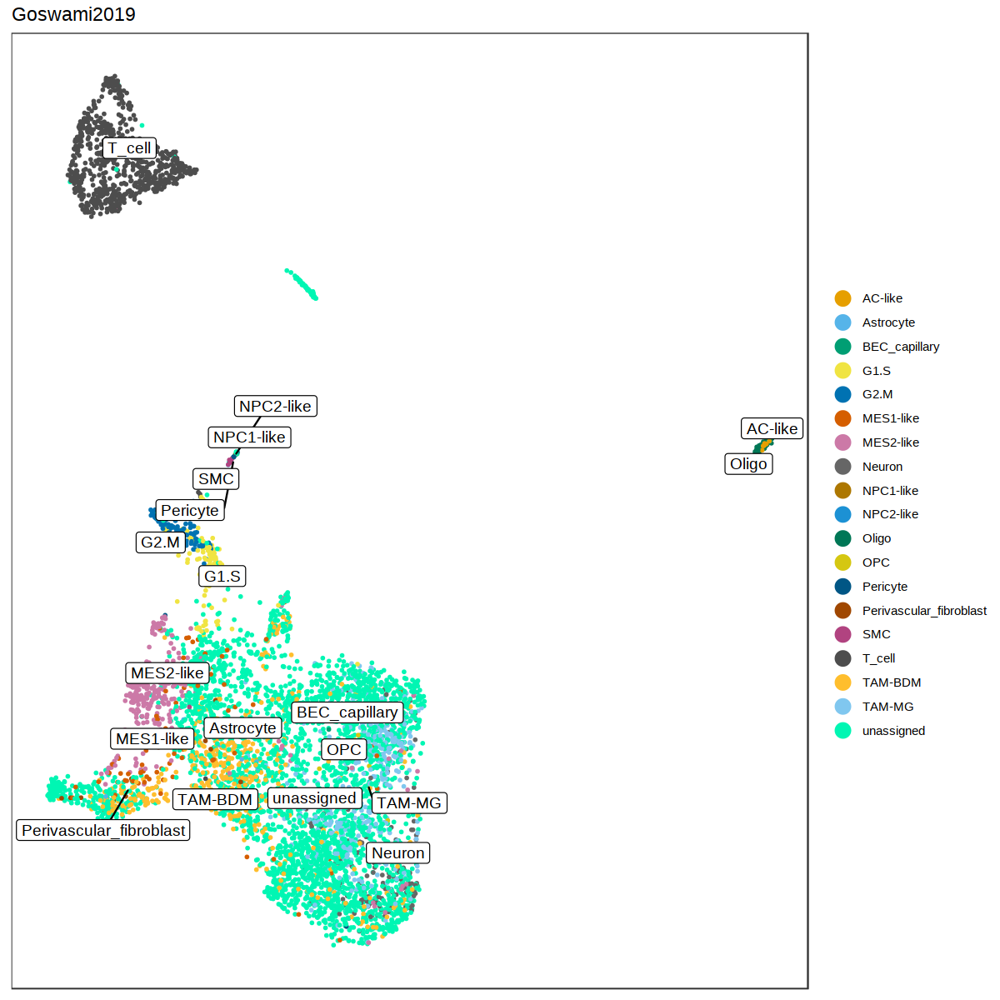

Warning message:
“ggrepel: 7 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


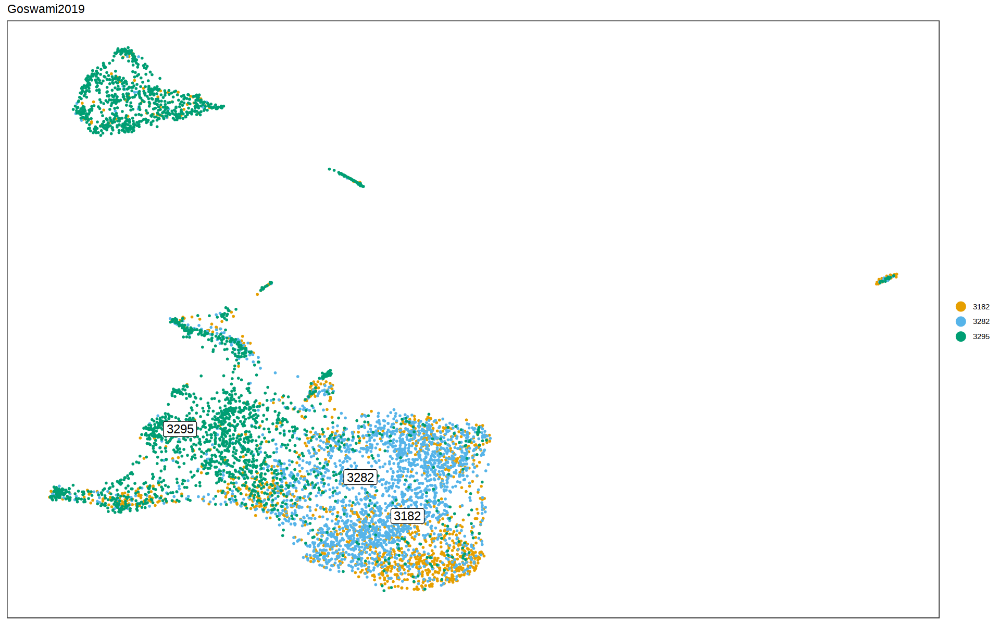

Warning message:
“ggrepel: 5 unlabeled data points (too many overlaps). Consider increasing max.overlaps”

calculating distance


ranking genes

calculating number of success


performing hypergeometric test


Warning message:
“ggrepel: 2 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


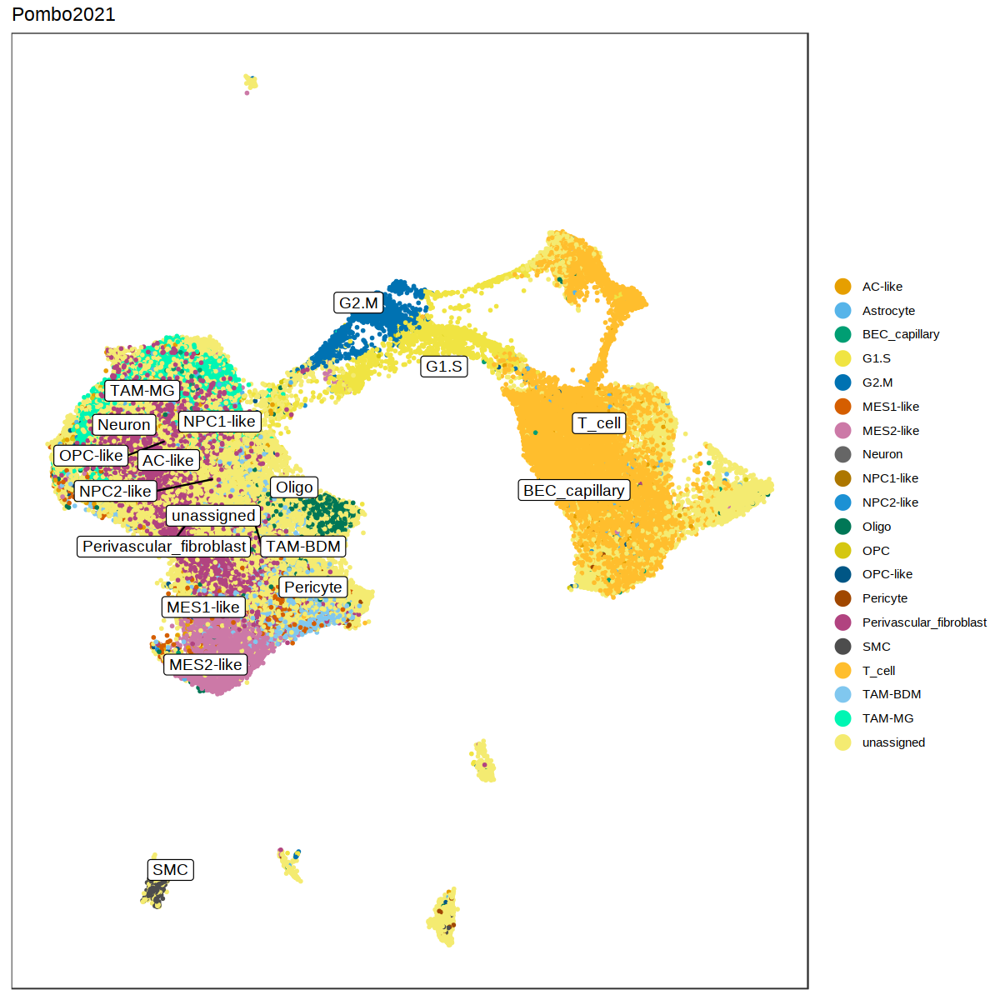

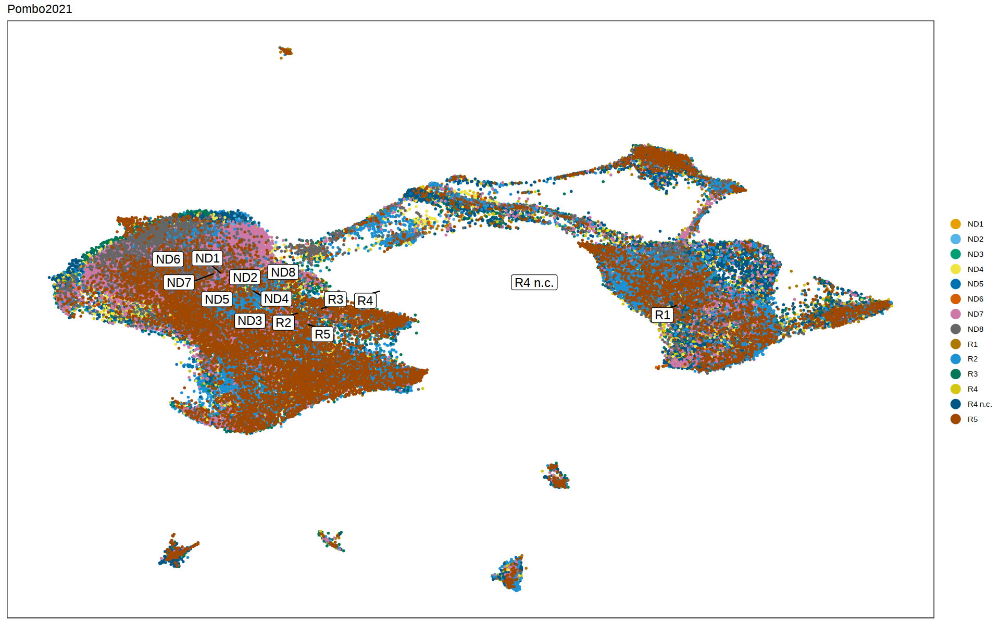


calculating distance


ranking genes

calculating number of success


performing hypergeometric test




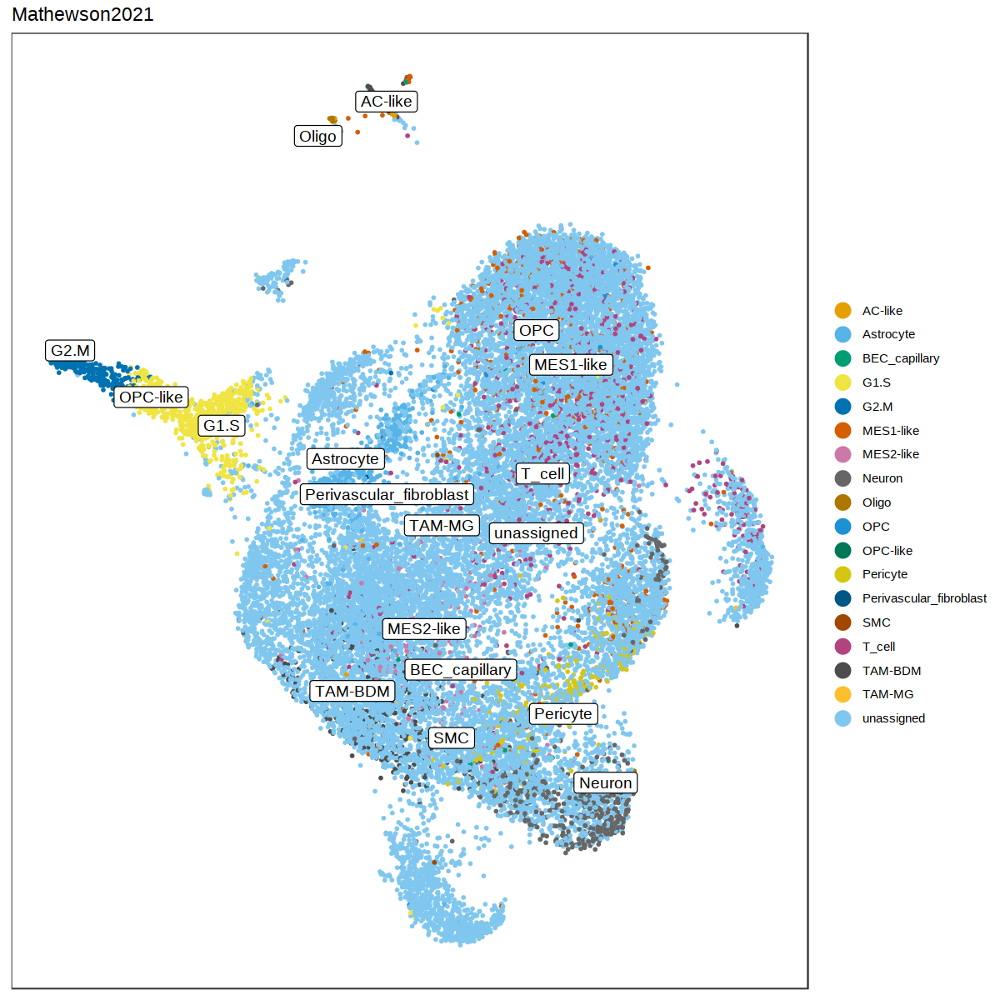

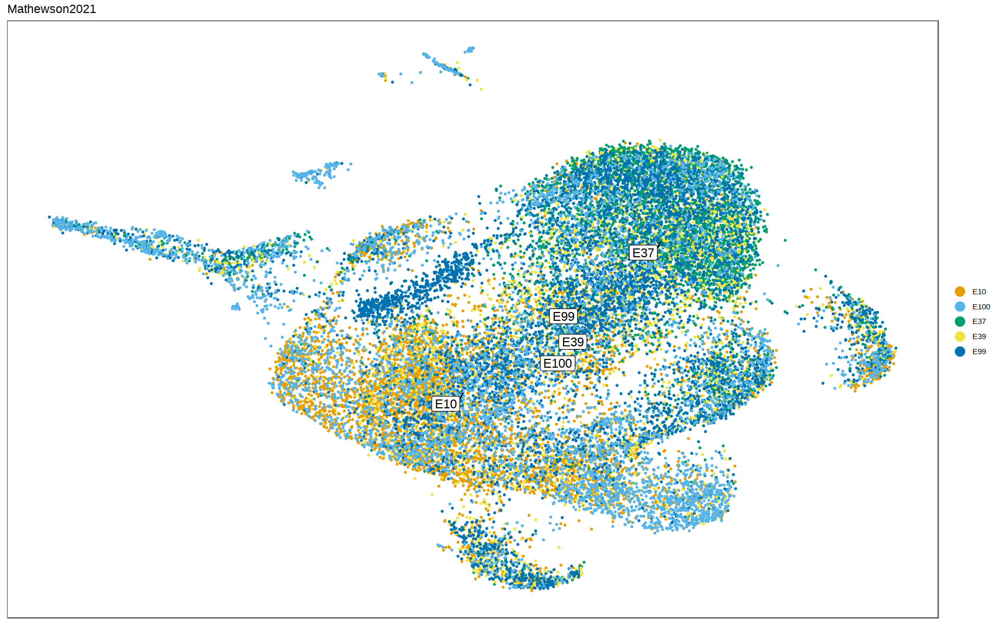

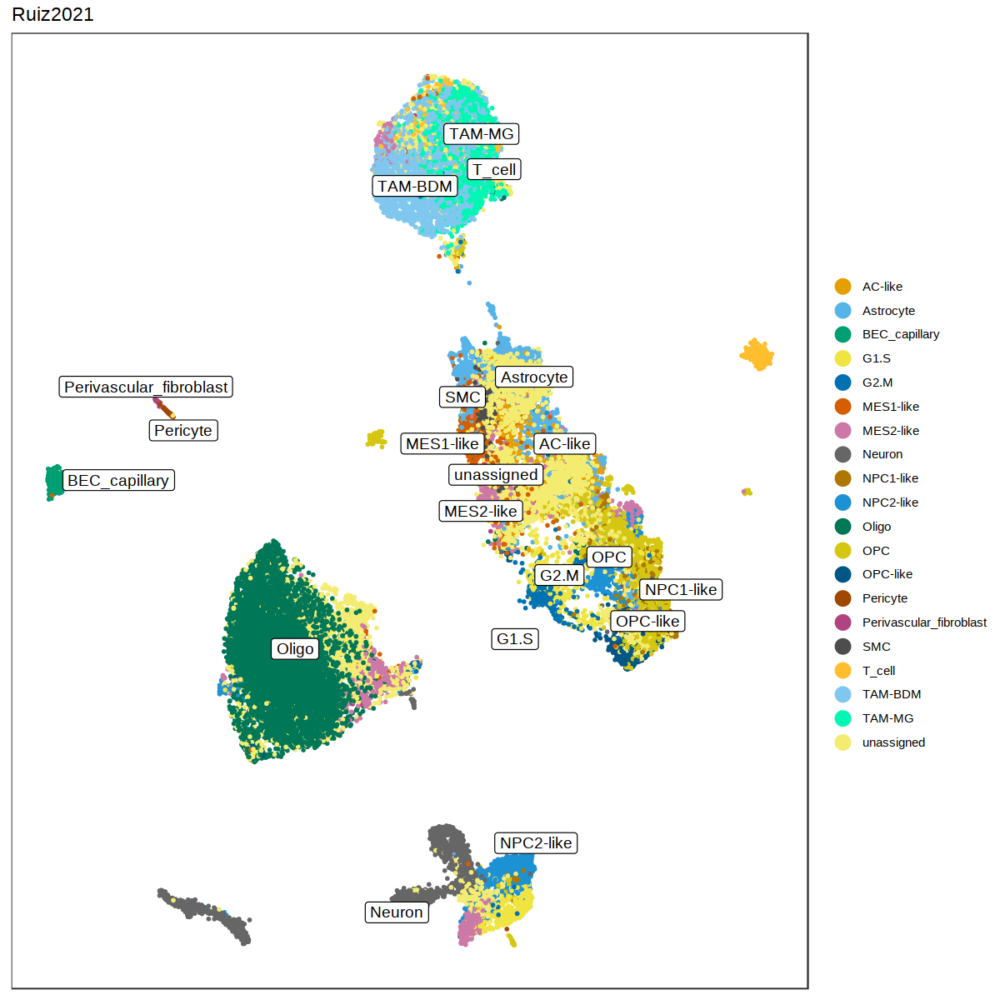

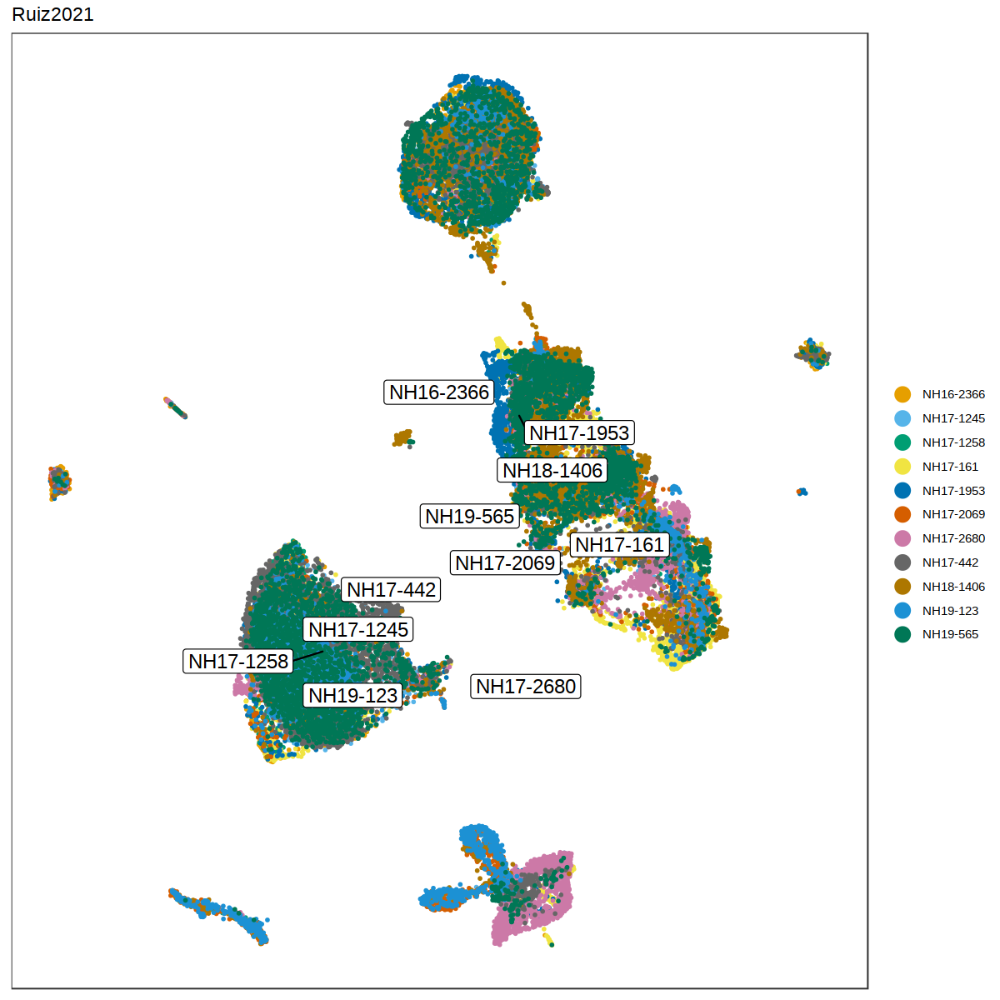

In [ ]:
for(i in 1:length(reference.list)){
    HGT_gbm_gs <- RunCellHGT(reference.list[[i]], pathways = signatures.list, dims = 1:50, n.features = 200)
    gs_prediction <- rownames(HGT_gbm_gs)[apply(HGT_gbm_gs, 2, which.max)]
    gs_prediction_signif <- ifelse(apply(HGT_gbm_gs, 2, max)>2, yes = gs_prediction, "unassigned")
    reference.list[[i]]$gs_prediction_main <- gs_prediction_signif
    
    options(repr.plot.height = 10, repr.plot.width = 16)
    print(dittoDimPlot(reference.list[[i]], reduction.use = "umap", var = "gs_prediction", 
                       do.label = T, labels.size = 4) + NoAxes() + ggtitle(names(reference.list[i])))
    options(repr.plot.height = 10, repr.plot.width = 10)
    print(dittoDimPlot(reference.list[[i]], reduction.use = "umap", var = "patient", 
                       do.label = T, labels.size = 5) + NoAxes() + ggtitle(names(reference.list[i])))
}

In [ ]:
gbm <- merge(reference.list[[1]], y = unlist(reference.list[2:length(reference.list)]), project = "GBM", merge.data = T)

In [ ]:
cellid <- data.frame(gs_prediction = gbm@meta.data$gs_prediction)
rownames(cellid) <- colnames(gbm)

In [ ]:
write.table(cellid,
            'data/core_GBmap_cellID.csv',
           row.names = TRUE, col.names = TRUE, quote = FALSE, sep = ',')

In [ ]:
saveRDS(reference.list, 'data/core_GBmap_annotated_CELLID.rds')